# Analysis of CoV-2 PhIP-Seq 
## Experiments 1, 2, 3, 4A, 5A, 5B from Caitlin and Mackenzie

A quick peek at the data resulting from the phippery-pipeline output. This analysis should also provide a clear look at how a `PhipData` Object can be manipulated to do cool things.

For this analysis we will follow "Peter's Five Pillars" of data analysis
1. Care, or at least think about the data
2. Look at the data
3. Query the Data
4. Sanity Check!
5. Communicate

## 1. What is this data and where did it come from?

Concretely this data is an instance of `phippery.PhipData` Object. The phipper-pipeline [here](https://github.com/matsengrp/phippery-experiments) outputs one of these objects for each reference found within the samples. The inputs to this pipeline are specified in a `JSON` config file on `Rhino` -> `/fh/fast/overbaugh_j/data-by-category/phip-seq/config`. 

The pipeline *DAG* looks like so: 

<img src="dag-1.png" alt="Drawing" style="width: 400px;"/>

**A few notes:**

1. The `collect_phip_data` step merges all the counts from each sample and takes either the mean or the sum, in this case we're looking at the average. No added "pseudo count" bias was added to the counts - because this is trivial to do _after_ collecting the *raw* counts.

2. We used bowtie, short-read, end-to-end alignment hueristic which trims the 3' end (right side, low quality end) and only look at the 5' end of the read up to the length of the peptides in out reference. Where the variables are listed in the config file above. `trim` = `read_length` - `peptide_length`.

```bash
zcat ${respective_replicate_path} |
        bowtie --trim3 ${trim} -n ${num_mm} -l ${tile_length} \
        --tryhard --nomaqround --norc --best --sam --quiet \
        ${index}/${ref_name} - \
        > ${ID}.${replicate_number}.sam
```

3. Pritha notes: "Bowtie1 is being used in this pipeline because it has worked well in this context. The alignment rates for all processed flowcells have been in the high 80s to low 90s, and I believe the jump in alignment rates from switching to bowtie2 won’t be dramatically high at this point. However that being said, it is definitely possible to switch to bowtie2 if you would like to perform local alignment instead of end-to-end. Someone might have to put in some time and figure out what the comparable arguments are between the two aligners, because those don’t directly match between the two aligners."

## 2. Let's take a Peek at the data.

In [36]:
import phippery
import pickle
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

Load the pickle dumped object

In [37]:
pds_mean = pickle.load(open("cov_exp_1_2_3_4A_5A_5B_mean_cov.phip","rb"))
print(f"The type of pds_mean and sum is {type(pds_mean)}")

The type of pds_mean and sum is <class 'phippery.PhipData.PhipData'>


In [38]:
print(f"All Sample Metadata: \n\n {pds_mean.sample_metadata.head()}\n")
print("##########################################################\n\n")
print(f"All Peptide Metadata: \n\n {pds_mean.peptide_metadata.head()}\n")
print("##########################################################\n\n")
print(f"All Peptide Metadata: \n\n {pds_mean.counts.head()}\n")

All Sample Metadata: 

       fastq_pattern reference         experiment submitted_by library_batch  \
ID                                                                            
0   ex1-rep*-1_*R1*       cov  20-04-21-cov2-ex1      caitlin          SUB2   
1   ex1-rep*-2_*R1*       cov  20-04-21-cov2-ex1      caitlin          SUB2   
2   ex1-rep*-3_*R1*       cov  20-04-21-cov2-ex1      caitlin          SUB2   
3   ex1-rep*-4_*R1*       cov  20-04-21-cov2-ex1      caitlin          SUB2   
4   ex1-rep*-5_*R1*       cov  20-04-21-cov2-ex1      caitlin          SUB2   

   control_status sample_ID                           sample_description  \
ID                                                                         
0       empirical         1    Anti-SARS Urbani E protein IgM clone 472C   
1       empirical         2     Anti SARS Urbani M protein IgM clone 19C   
2       empirical         3  Anti-SARS Urbani S protein IgG2a clone 240C   
3       empirical         4  Anti-SARS Urb

What we're looking at here is the aggregate of three different experiments

In [39]:
for exp in set(pds_mean.sample_metadata["experiment"]):
    print(exp)

20-06-02-cov2-ex5b
20-05-14-cov2-ex4a
20-04-21-cov2-ex2
20-04-25-cov2-ex3
20-04-21-cov2-ex1
20-05-27-cov2-ex5a


The pipeline optionally tacks on information about the technical number of technical replicates and their respective correlations. Let's take a look at some technical replicate information:

In [40]:
sample_meta = pds_mean.sample_metadata
two_replicate_samples = sample_meta[sample_meta["num_tech_reps"] == 2]
single_replicate_samples = sample_meta[sample_meta["num_tech_reps"] == 1]
print(f"samples with 2 replicates:\n\n {two_replicate_samples.index}\n\n")
print(f"samples with 1 replicates:\n\n {single_replicate_samples.index}\n\n")

samples with 2 replicates:

 Int64Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
            ...
            238, 239, 240, 241, 242, 243, 244, 245, 246, 247],
           dtype='int64', name='ID', length=243)


samples with 1 replicates:

 Int64Index([47, 48, 52, 85, 144], dtype='int64', name='ID')




In [41]:
print(single_replicate_samples)

                 fastq_pattern reference          experiment submitted_by  \
ID                                                                          
47      ex1-rep1-48-beads_*R1*       cov   20-04-21-cov2-ex1      caitlin   
48         ex1-48-library_*R1*       cov   20-04-21-cov2-ex1      caitlin   
52                 rep*-4_*R1*       cov  20-05-27-cov2-ex5a      caitlin   
85                rep*-37_*R1*       cov  20-05-27-cov2-ex5a      caitlin   
144  ex5b-rep1-48-library_*R1*       cov  20-06-02-cov2-ex5b    mackenzie   

    library_batch control_status sample_ID  \
ID                                           
47           SUB2     beads_only       NaN   
48           SUB2        library       NaN   
52         MEGSUB      empirical        44   
85         MEGSUB      empirical        75   
144          SUB2        library       NaN   

                           sample_description sample_type species  \
ID                                                                  

Is this right? It looks like sample #52 and #85 are samples we didn't find replicates for? This could be a bug where the fastq patterns didn't quite match both replicates ... worth looking into.

We can use the `PhipData.split_by_sample_column` method to seperate the experiments. This method take in a column name and returns a dictionary containing the unique factor and an associated `PhipData` object.

In [42]:
experiment_dict = pds_mean.split_by_sample_column("experiment")
for experiment, pds in experiment_dict.items():
    print(f"{experiment}: {type(pds)}")

20-04-21-cov2-ex1: <class 'phippery.PhipData.PhipData'>
20-04-21-cov2-ex2: <class 'phippery.PhipData.PhipData'>
20-04-25-cov2-ex3: <class 'phippery.PhipData.PhipData'>
20-05-14-cov2-ex4a: <class 'phippery.PhipData.PhipData'>
20-05-27-cov2-ex5a: <class 'phippery.PhipData.PhipData'>
20-06-02-cov2-ex5b: <class 'phippery.PhipData.PhipData'>


Now, we have seperate `PhipData` objects for each experiment, organized in a nice dictionary.

### 2.1 Technical Replicates

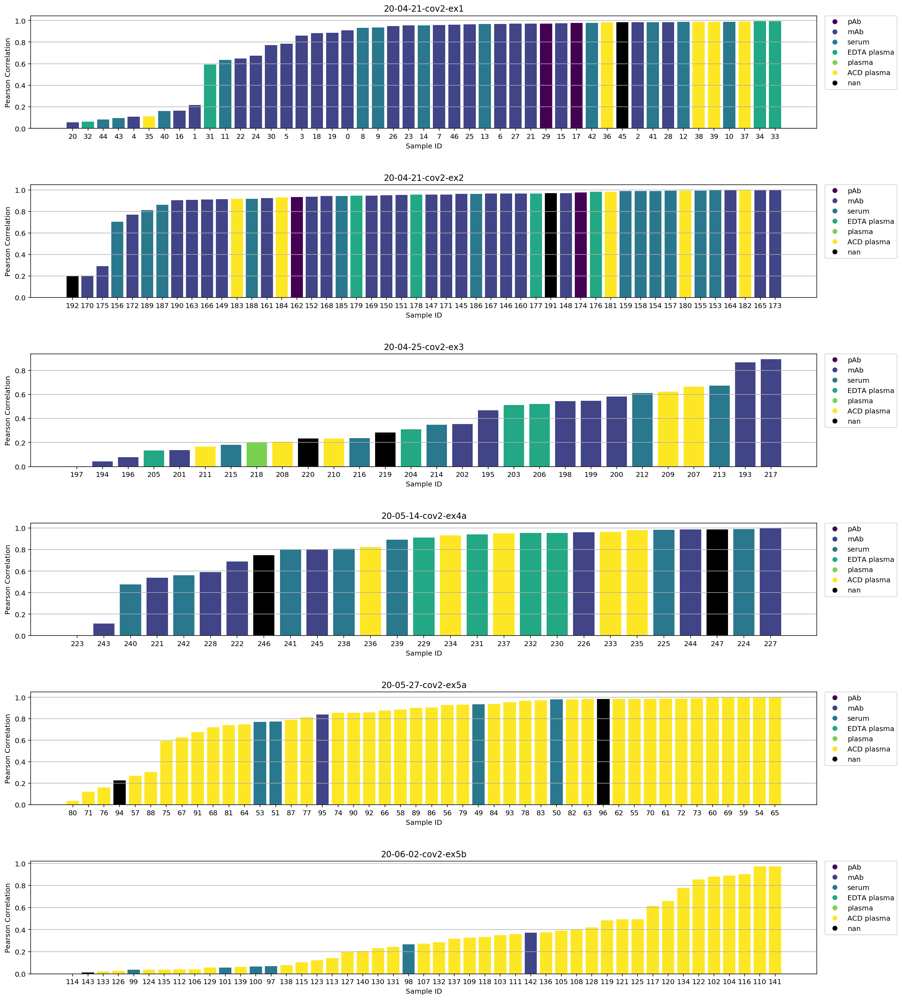

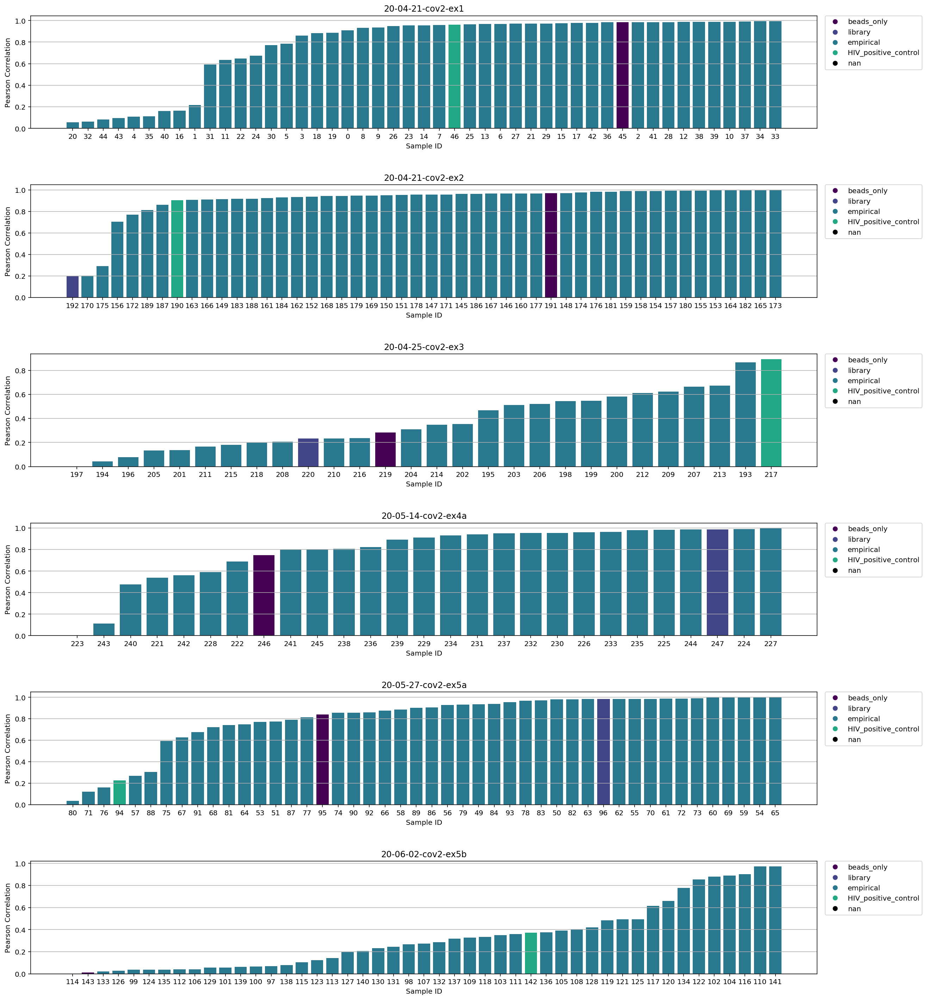

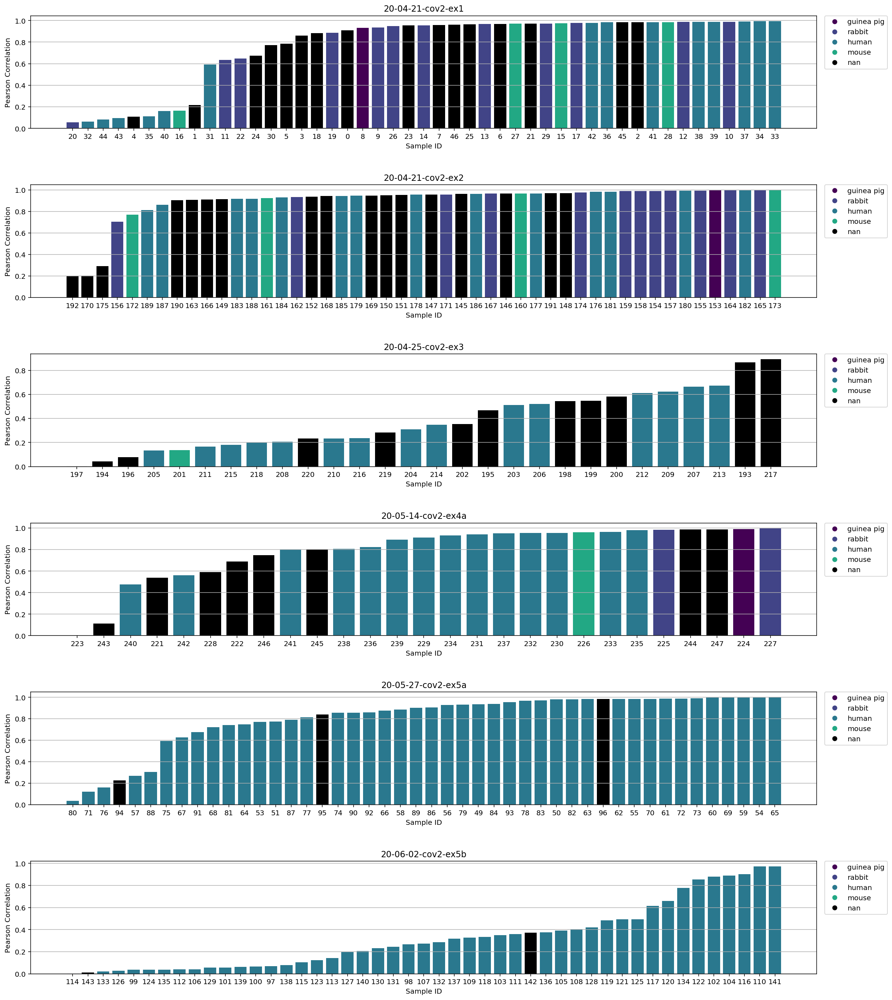

In [84]:
cmap = plt.get_cmap('viridis')
for coloring_by in ["sample_type", "control_status", "species"]:
    groups = {x for x in set(pds_mean.sample_metadata[coloring_by]) if x == x}
    colors = cmap(np.linspace(0, 1, len(coloring_group)))
    color_dict = {group : col for group, col in zip(list(groups), colors)}
    color_dict[np.nan] = [0.0,0.0,0.0,1.0]
    fig, ax = plt.subplots(len(experiment_dict), figsize=(20,25))
    
    for idx, (experiment, pds) in enumerate(experiment_dict.items()):
        sample_meta = pds.sample_metadata
        two_replicate_samples = sample_meta[sample_meta["num_tech_reps"] == 2]
        control_st = two_replicate_samples[f"{coloring_by}"]
        sam_id = two_replicate_samples.index
        corr = two_replicate_samples.tech_rep_correlation
        sorted_con_st = [x for _,x in sorted(zip(corr,control_st))]
        sorted_sam_id = [x for _,x in sorted(zip(corr,sam_id))]
        sorted_sam_id = [str(i) for i in sorted_sam_id]
        sorted_corr = sorted(corr)
        sorted_colors = []
        for con_st in sorted_con_st:
            if con_st != con_st:
                sorted_colors.append([0.0,0.0,0.0,1.0])
            else:
                sorted_colors.append(color_dict[con_st])
        ax[idx].bar(sorted_sam_id, sorted_corr, color=sorted_colors)
        ax[idx].set_title(f"{experiment}")
        ax[idx].set_ylabel("Pearson Correlation")
        ax[idx].set_xlabel("Sample ID")
        ax[idx].yaxis.grid()
        markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_dict.values()]
        ax[idx].legend(markers, color_dict.keys(), bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
    plt.subplots_adjust(hspace = 0.5)
    fig.savefig("correlation_by_experiment_{coloring_by}.pdf")
    plt.show()

### 2.2 Raw Counts Peek

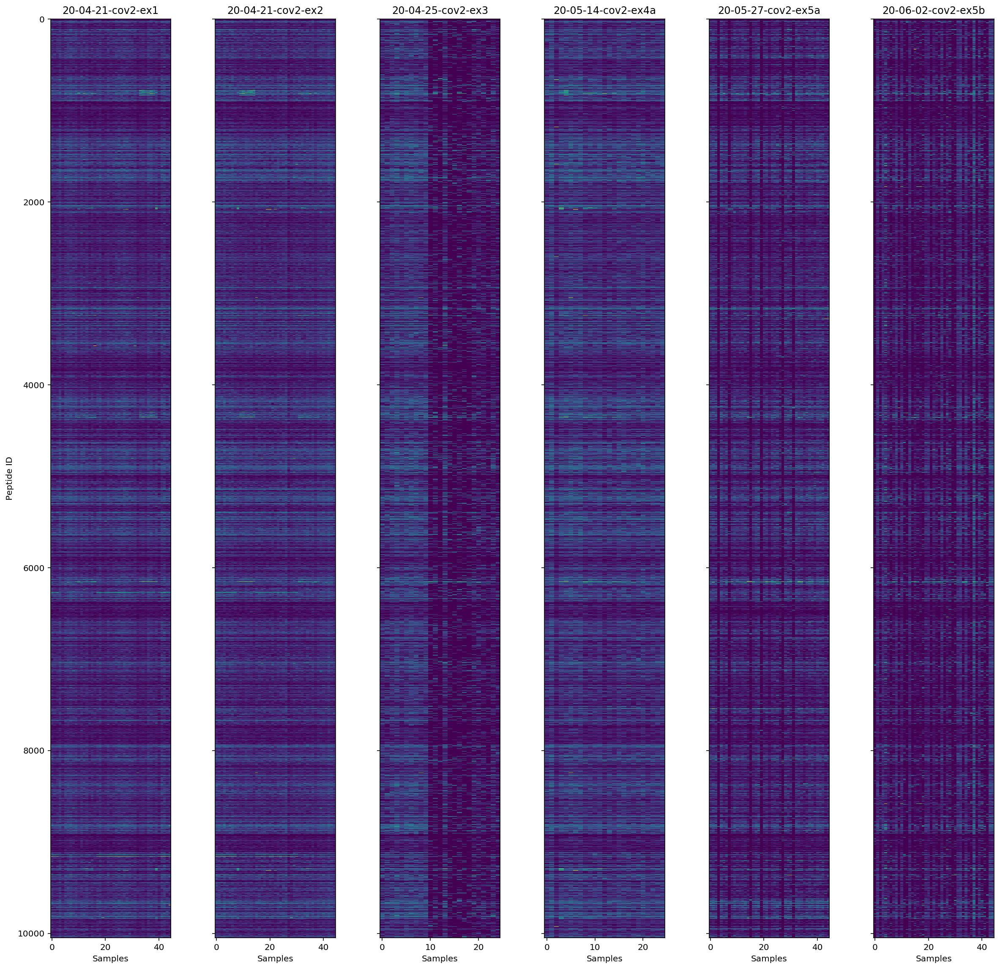

In [100]:
fig, ax = plt.subplots(1, len(experiment_dict), figsize=(20,20), sharey=True)
for idx, (experiment, pds) in enumerate(experiment_dict.items()):
    emp_samples = pds.sample_metadata[pds.sample_metadata["control_status"] == "empirical"].index
    empirical_counts = pds.counts.loc[:,emp_samples]
    empirical_counts += 0.1 # so we can do log
    ax[idx].imshow(np.log(empirical_counts), aspect="auto")
    ax[idx].set_title(f"{experiment}")
    ax[idx].set_xlabel("Samples")
ax[0].set_ylabel("Peptide ID")
plt.subplots_adjust(wspace=0.37)
plt.show()

In [101]:
for idx, (experiment, pds) in enumerate(experiment_dict.items()):
    beads_meta = pds.sample_metadata[pds.sample_metadata["control_status"] == "beads_only"]
    lib_meta = pds.sample_metadata[pds.sample_metadata["control_status"] == "library"]
    print("\n######################################")
    print(f"\nExperiment {experiment}:")
    print(f"\n BEADS ONLY SAMPLES:\n\n {beads_meta}")
    print(f"\n INPUT LIBRARY SAMPLES:\n\n {lib_meta}")


######################################

Experiment 20-04-21-cov2-ex1:

 BEADS ONLY SAMPLES:

              fastq_pattern reference         experiment submitted_by  \
ID                                                                     
45  ex1-rep*-46-beads_*R1*       cov  20-04-21-cov2-ex1      caitlin   
47  ex1-rep1-48-beads_*R1*       cov  20-04-21-cov2-ex1      caitlin   

   library_batch control_status sample_ID sample_description sample_type  \
ID                                                                         
45          SUB2     beads_only       NaN         beads only         NaN   
47          SUB2     beads_only       NaN         beads only         NaN   

   species participant_ID  age  sex race  days_from_symptom_onset source  \
ID                                                                         
45     NaN            NaN  NaN  NaN  NaN                      NaN    NaN   
47     NaN            NaN  NaN  NaN  NaN                      NaN    NaN   

    nu

## 3. Query

Alright, now that we've *peeked* at the data and are convinced that what we've seen is sensible, lets compute some (somewhat trivial) and focus in a little more on a single experiment. Somewhat arbitrarily, I'm going to look at Experiment 2. Below, a function is designed to look at the enrichments for any one virus within a particular `phippery.PhipData` Object.

A few things to note before diving in.

1. Standard enrichment is dependent on first converting the counts in terms of the "frequency" or the counts diveded by all counts seen for that sample. Here, we are looking at that frequency in terms of a single virus - should this be across the entirety of the dataset?

2. For Experiment 2, it looks like out library input has quite *low* correlation. How big of a problem that is I have no idea.

3. We're not dumping low corr tech replicate samples. 

In [244]:
experiment = "20-04-21-cov2-ex2"
sam = experiment_dict[experiment].sample_metadata
print(sam[sam["control_status"] == "beads_only"][["num_tech_reps","tech_rep_correlation","control_status"]])
print()
print(sam[sam["control_status"] == "library"][["num_tech_reps","tech_rep_correlation","control_status"]])

     num_tech_reps  tech_rep_correlation control_status
ID                                                     
191              2              0.968314     beads_only

     num_tech_reps  tech_rep_correlation control_status
ID                                                     
192              2              0.200954        library


In [252]:
def plot_virus_strain_standardized_enrichment(
    pds, exp_name, virus, sample_split_column = "reference", pseudo_count_bias = 5
):
    """
    A general purpose function to plot a single virus strain for a single experiment.
    
    :param: pds - a phippery.PhipData object with the data of interest.
    
    :param: exp_name - a string for the name of the experiment you want to put on the plots.
    
    :param: virus - the name of virus strain you would like to look at, this should exist in
        the set of all virus's found in peptide_metadata "Virus" column.
        
    :param: sample_split_column - By choosing a column header in the sample metadata,
        this will generate N different plots with sampled grouped by unique factors in
        this column.
    """
    
    # split the phip dataset and grab the virus strain of interest
    virus_split = pds.split_by_peptide_column("Virus")
    virus_pds = virus_split[virus]
    
    # compute standardized enrichment
    virus_pds.counts += pseudo_count_bias
    frequencies = virus_pds.counts.truediv(virus_pds.counts.sum(axis=0), axis=1)
    
    lib_control = virus_pds.sample_metadata[virus_pds.sample_metadata["control_status"] == "library"]
    lib_counts = frequencies[lib_control.index].mean(axis=1)
    enrichment = frequencies.truediv(lib_counts, axis=0)
    
    beads_control = virus_pds.sample_metadata[virus_pds.sample_metadata["control_status"] == "beads_only"]
    beads_counts = enrichment[beads_control.index].mean(axis=1)
    standardized_enrichment = enrichment.subtract(beads_counts, axis=0)
    
    # plot enrichments.
    virus_sample_split = virus_pds.split_by_sample_column(sample_split_column)
    fig, ax = plt.subplots(len(virus_sample_split), figsize=(10,10))
    ax = [ax] if len(virus_sample_split) == 1 else ax
    prot_start = virus_pds.peptide_metadata["Prot_Start"]
    for idx, (sample_group, local_pds) in enumerate(virus_sample_split.items()):
        ax[idx].set_title(f"{exp_name}\n{virus}\n{sample_group}")
        for ID, sample in local_pds.sample_metadata.iterrows():
            sample_enrichment = standardized_enrichment.loc[:,ID]
            ax[idx].plot(prot_start, sample_enrichment, label = ID)
        ax[idx].legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
    plt.subplots_adjust(hspace=1.0)
    plt.show()

Below, we can see all available parameters for the function above.

In [246]:
all_strains = set(pds_mean.peptide_metadata["Virus"])
print(f"Available strains: \n\n{all_strains}\n\n")
print(f"Available sample metadata split columns: \n\n{list(pds_mean.sample_metadata.columns)}\n\n")

Available strains: 

{'HKU1_N13A_envelope', 'HKU1_Caen1_orf4_protein', 'MERS_KFMC4_envelope', 'NL63_91156_replicase_polyprotein_1ab', 'OC43_98204_nsp4', 'OC43_98204_spike', 'NL63_01231_spike', 'HKU1_N13A_replicase_polyprotein_1ab', 'NL63_01231_replicase_polyprotein_1ab', 'SARS_Urbani_nucleocapsid', '229E_93272_envelope', 'SARS_Urbani_protein_X1', '229E_SC0865_nucleocapsid', 'SARSCoV2_WuhanHu1_spike', '229E_93272_replicase_polyprotein_1ab', 'batSL_CoVZC45_membrane', 'SARSCoV2_WuhanHu1_envelope', 'HKU1_Caen1_HE', '229E_SC0865_accessory_protein', 'SARSCoV2_WuhanHu1_ORF8_protein', 'NL63_ChinaGD01_envelope', 'HKU1_SI17244_spike', 'HKU1_N13A_hypothetical_protein_orf8', '229E_SC0865_envelope', 'OC43_SC0776_nsp2a', 'HKU1_Caen1_membrane', 'HKU1_SI17244_nucleocapsid', 'OC43_98204_membrane', 'OC43_12689_nonstructural', 'NL63_01231_envelope', 'SARSCoV2_WuhanHu1_replicase_polyprotein_1ab', 'OC43_12689_nucleocapsid', 'HKU1_SI17244_envelope', 'NL63_ChinaGD01_nsp3', 'HKU1_N13A_nucleocapsid', 'NL63_Kil

the plots below will contain a legend associating a line _color_ with a sample __ID__. all available information about the samples for the specified e

In [247]:
experiment = "20-04-21-cov2-ex2"
experiment_dict[experiment].sample_metadata

,fastq_pattern,reference,experiment,submitted_by,library_batch,control_status,sample_ID,sample_description,sample_type,species,participant_ID,age,sex,race,days_from_symptom_onset,source,num_tech_reps,tech_rep_correlation
ID,,,,,,,,,,,,,,,,,,
145,ex2-rep*-1_*R1*,cov,20-04-21-cov2-ex2,caitlin,SUB2,empirical,1,Anti-SARS Urbani E protein IgM clone 472C,mAb,NaN,NaN,NaN,NaN,NaN,NaN,BEI/ATCC,2,0.963647
146,ex2-rep*-2_*R1*,cov,20-04-21-cov2-ex2,caitlin,SUB2,empirical,2,Anti SARS Urbani M protein IgM clone 19C,mAb,NaN,NaN,NaN,NaN,NaN,NaN,BEI/ATCC,2,0.965775
147,ex2-rep*-3_*R1*,cov,20-04-21-cov2-ex2,caitlin,SUB2,empirical,3,Anti-SARS Urbani S protein IgG2a clone 240C,mAb,NaN,NaN,NaN,NaN,NaN,NaN,BEI/ATCC,2,0.957277
148,ex2-rep*-4_*R1*,cov,20-04-21-cov2-ex2,caitlin,SUB2,empirical,4,Anti-SARS Urbani S protein IgG2a clone 341C,mAb,NaN,NaN,NaN,NaN,NaN,NaN,BEI/ATCC,2,0.969860
149,ex2-rep*-5_*R1*,cov,20-04-21-cov2-ex2,caitlin,SUB2,empirical,5,Anti-SARS Urbani S protein IgG2a clone 540C,mAb,NaN,NaN,NaN,NaN,NaN,NaN,BEI/ATCC,2,0.914526
150,ex2-rep*-6_*R1*,cov,20-04-21-cov2-ex2,caitlin,SUB2,empirical,6,Anti-SARS N protein IgM clone 42C,mAb,NaN,NaN,NaN,NaN,NaN,NaN,BEI/ATCC,2,0.950389
151,ex2-rep*-7_*R1*,cov,20-04-21-cov2-ex2,caitlin,SUB2,empirical,7,Anti-SARS Urbani S protein igM clone 154C,mAb,NaN,NaN,NaN,NaN,NaN,NaN,BEI/ATCC,2,0.953098
152,ex2-rep*-8_*R1*,cov,20-04-21-cov2-ex2,caitlin,SUB2,empirical,8,Anti-SARS Urbani M protein IgG1 clone 283C,mAb,NaN,NaN,NaN,NaN,NaN,NaN,BEI/ATCC,2,0.937244
153,ex2-rep*-9_*R1*,cov,20-04-21-cov2-ex2,caitlin,SUB2,empirical,9,Guinea pig anti-SARS sera,serum,guinea pig,NaN,NaN,NaN,NaN,NaN,BEI/ATCC,2,0.995228


OC43_98204_spike


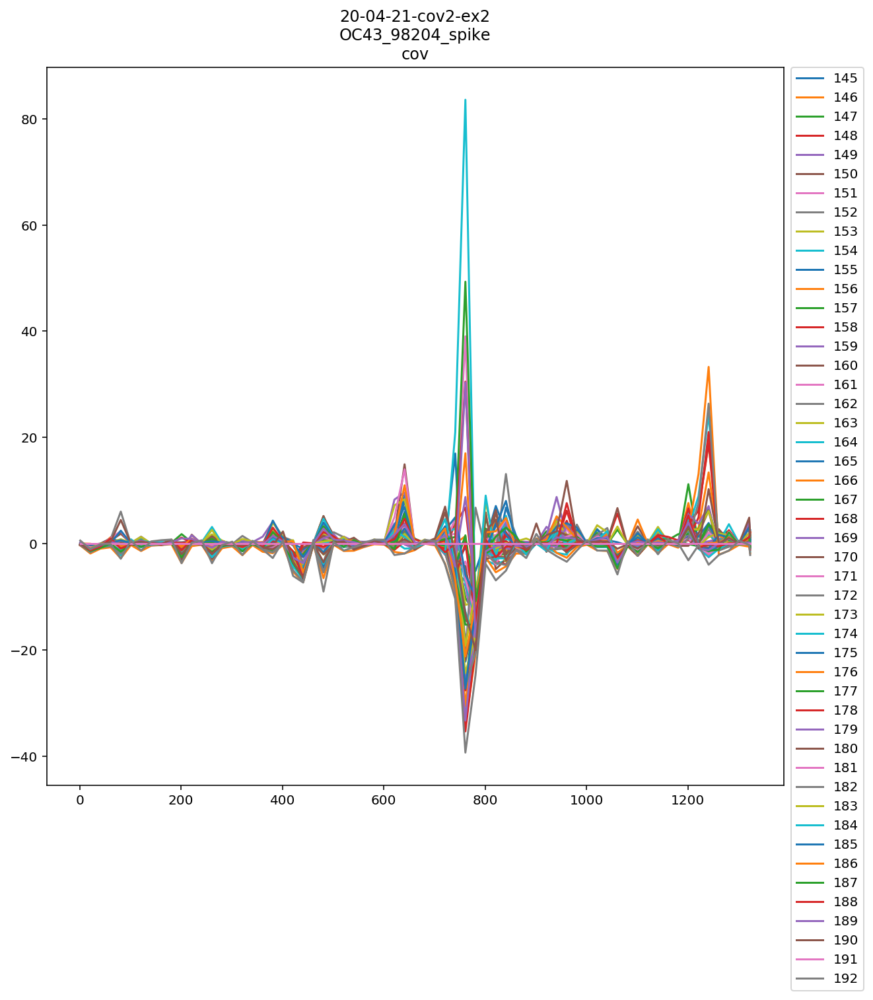

NL63_01231_spike


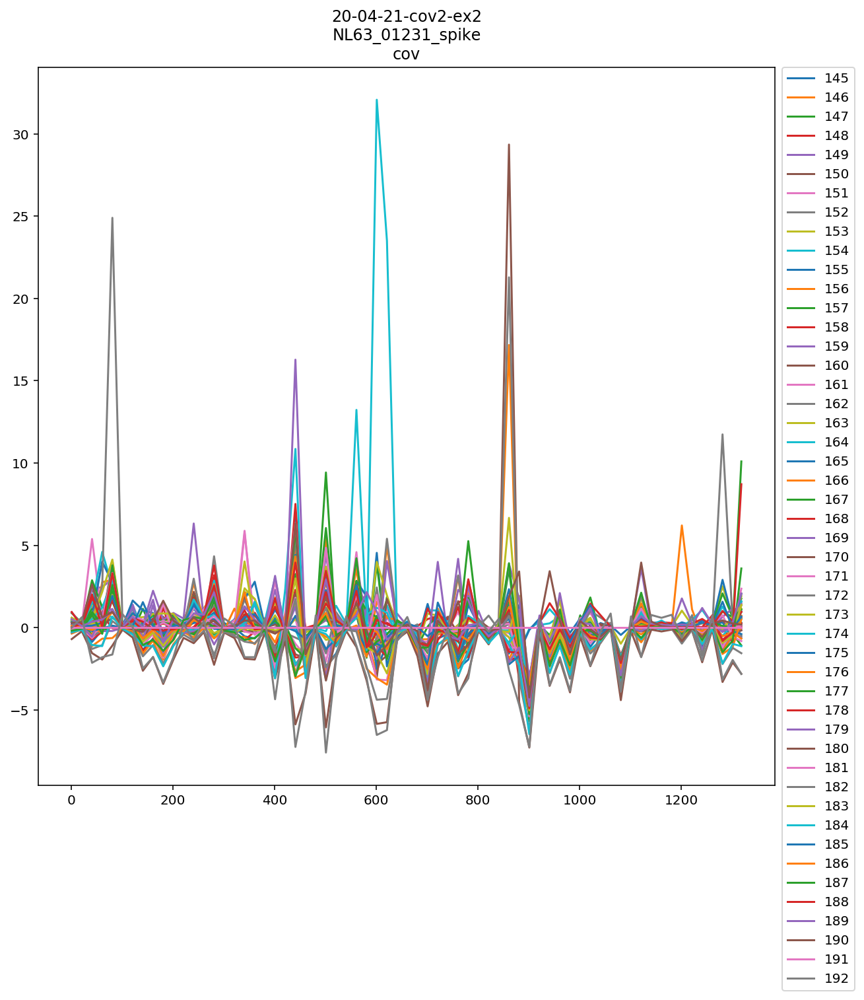

NL63_01231_replicase_polyprotein_1ab


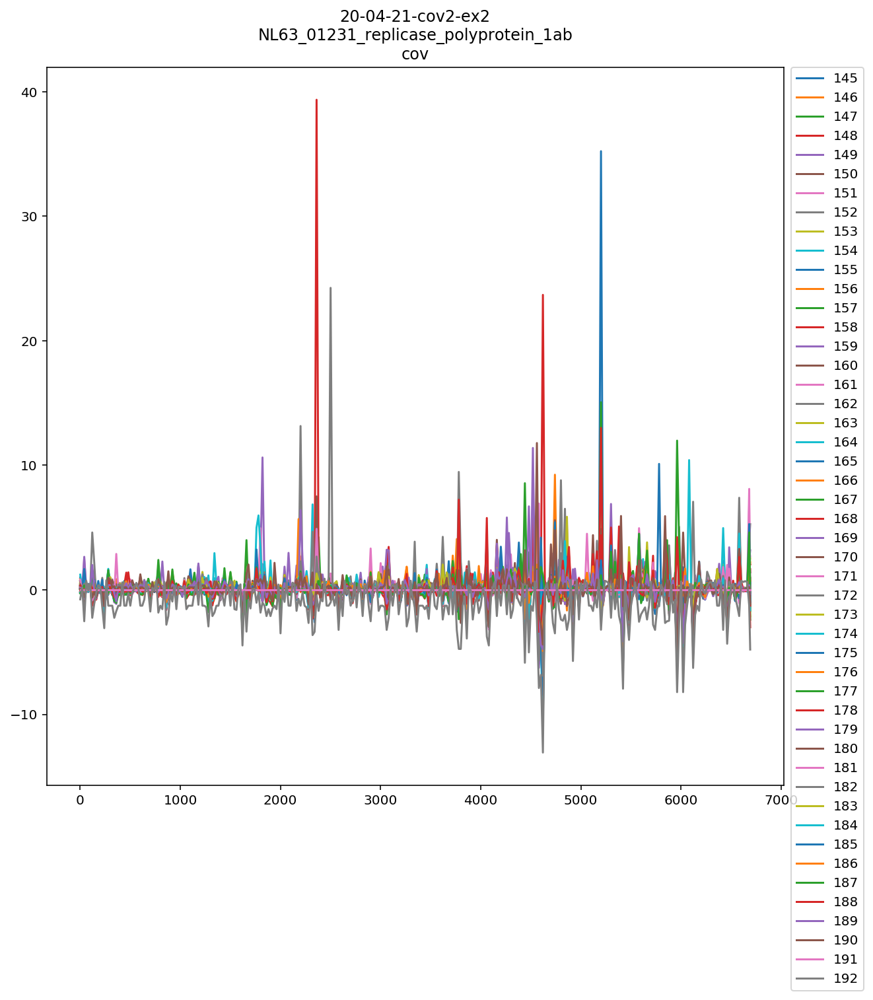

SARS_Urbani_nucleocapsid


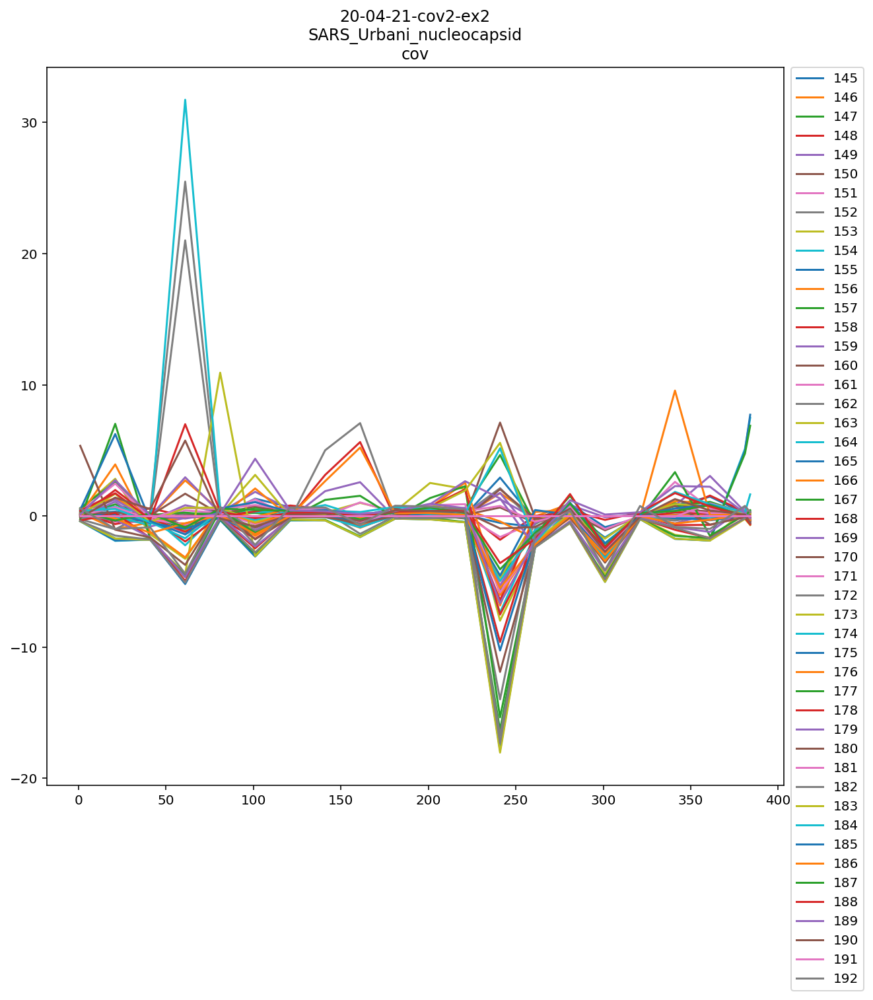

SARSCoV2_WuhanHu1_spike


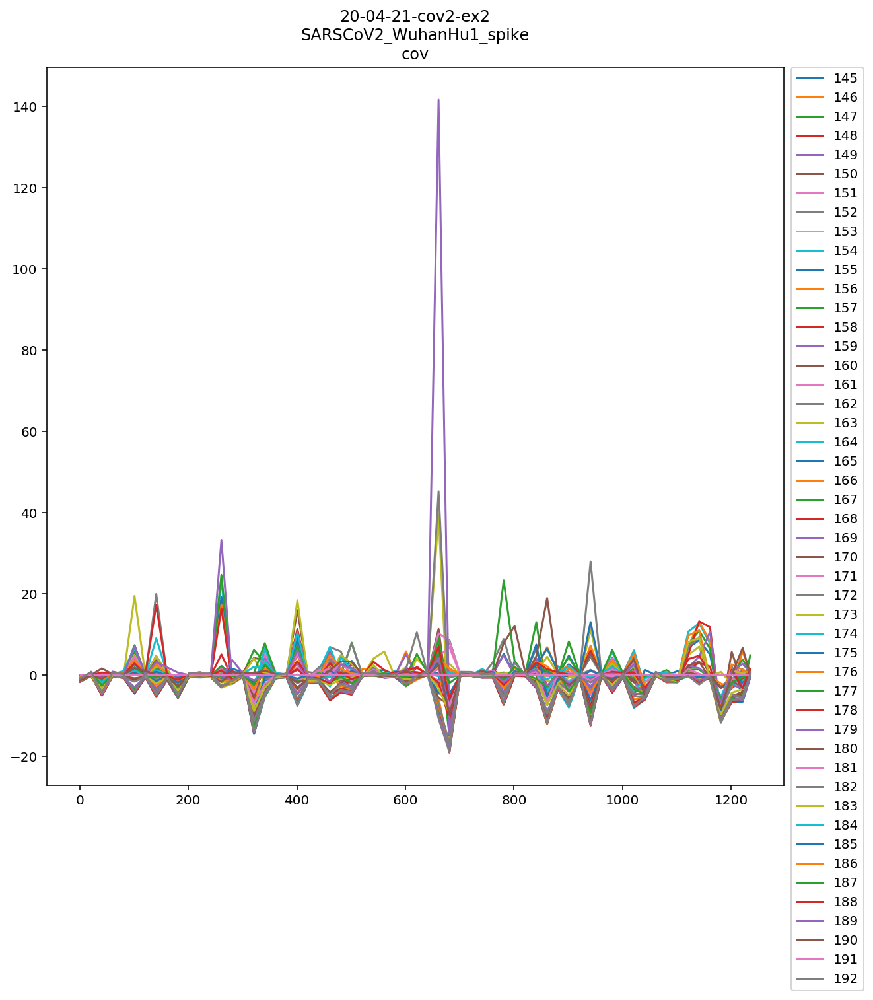

HKU1_SI17244_spike


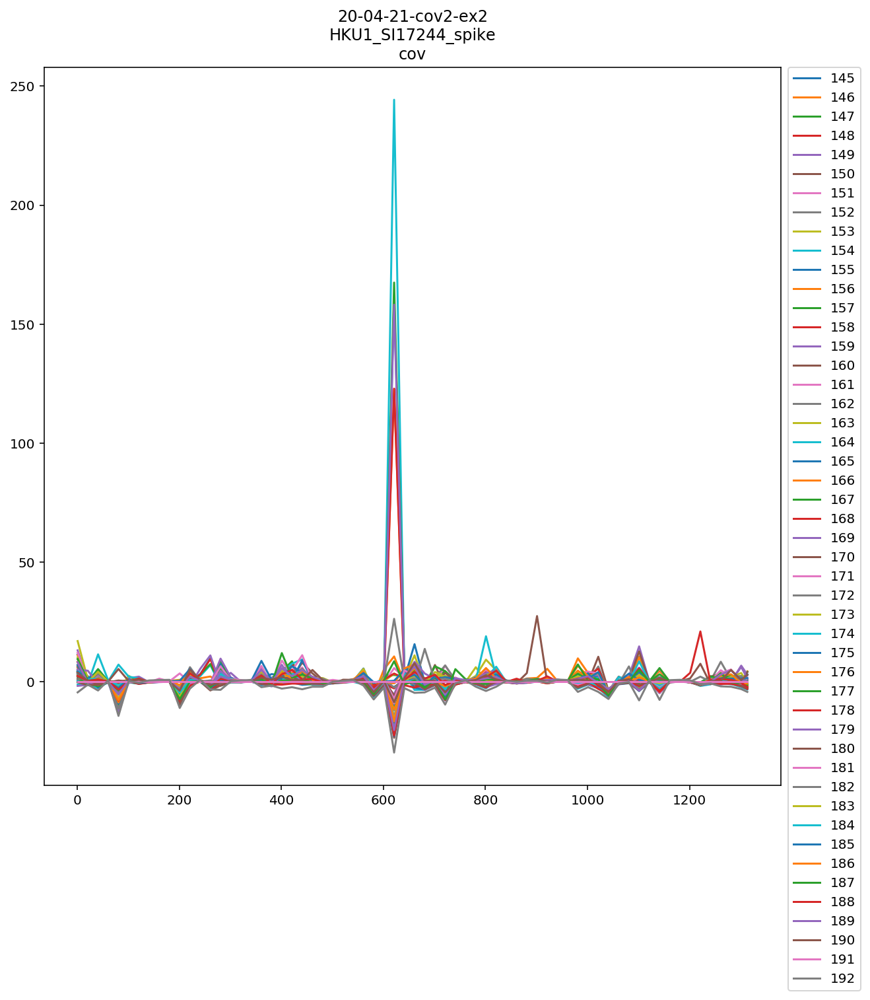

HKU1_SI17244_nucleocapsid


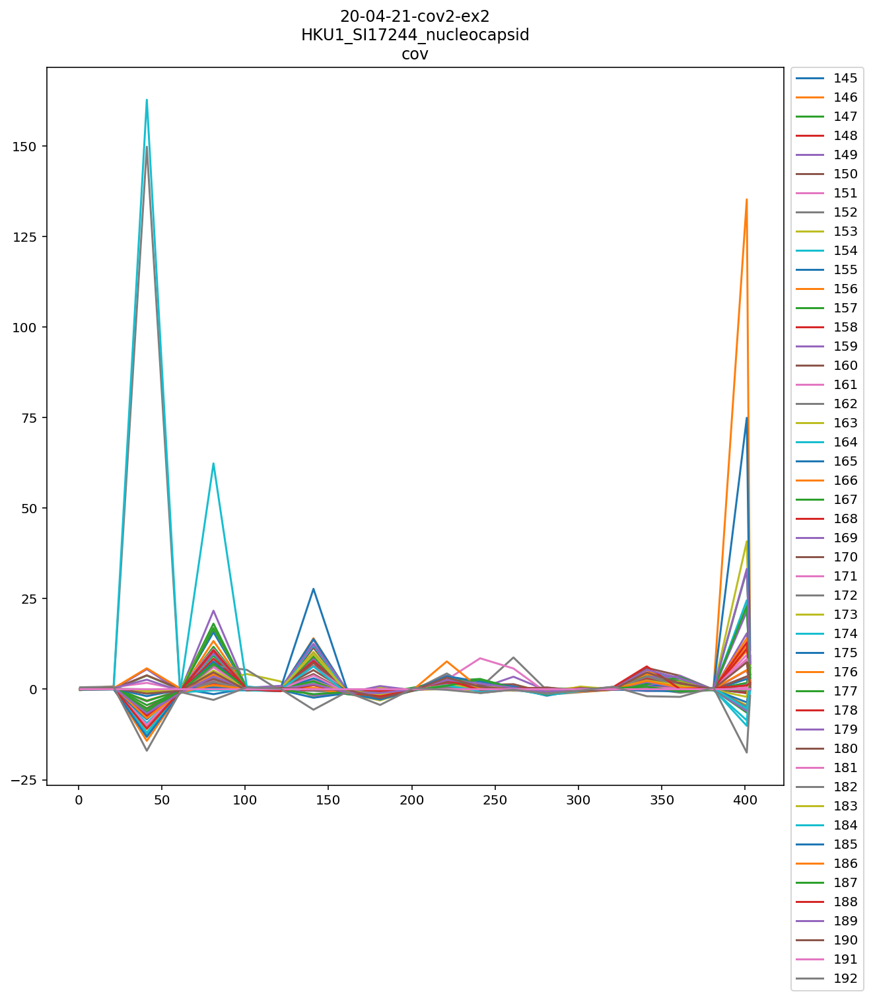

SARSCoV2_WuhanHu1_replicase_polyprotein_1ab


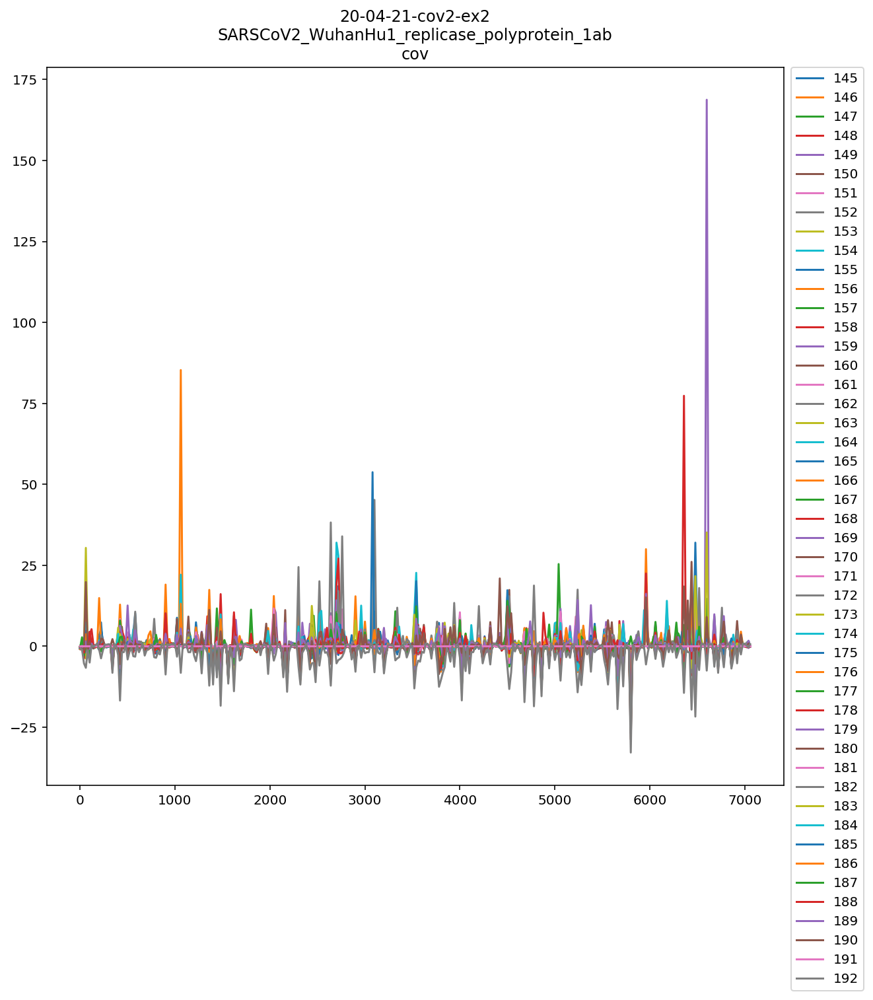

229E_SC0865_replicase_polyprotein_1ab


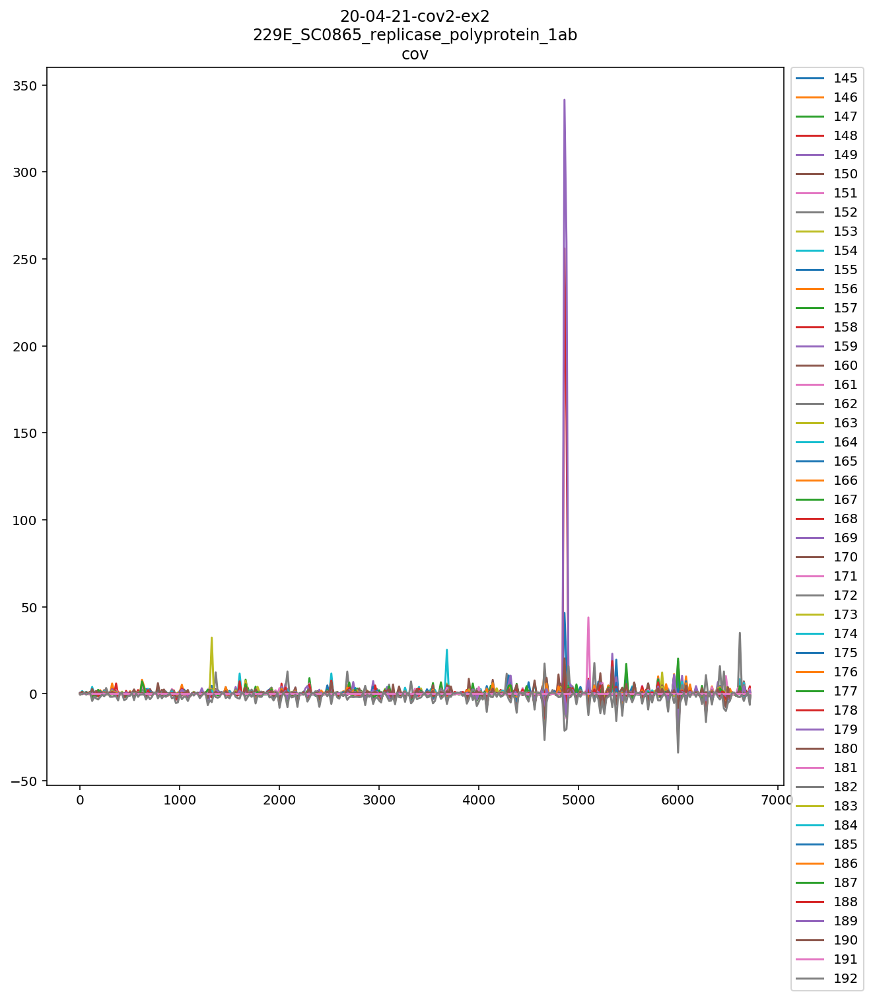

HKU1_Caen1_spike


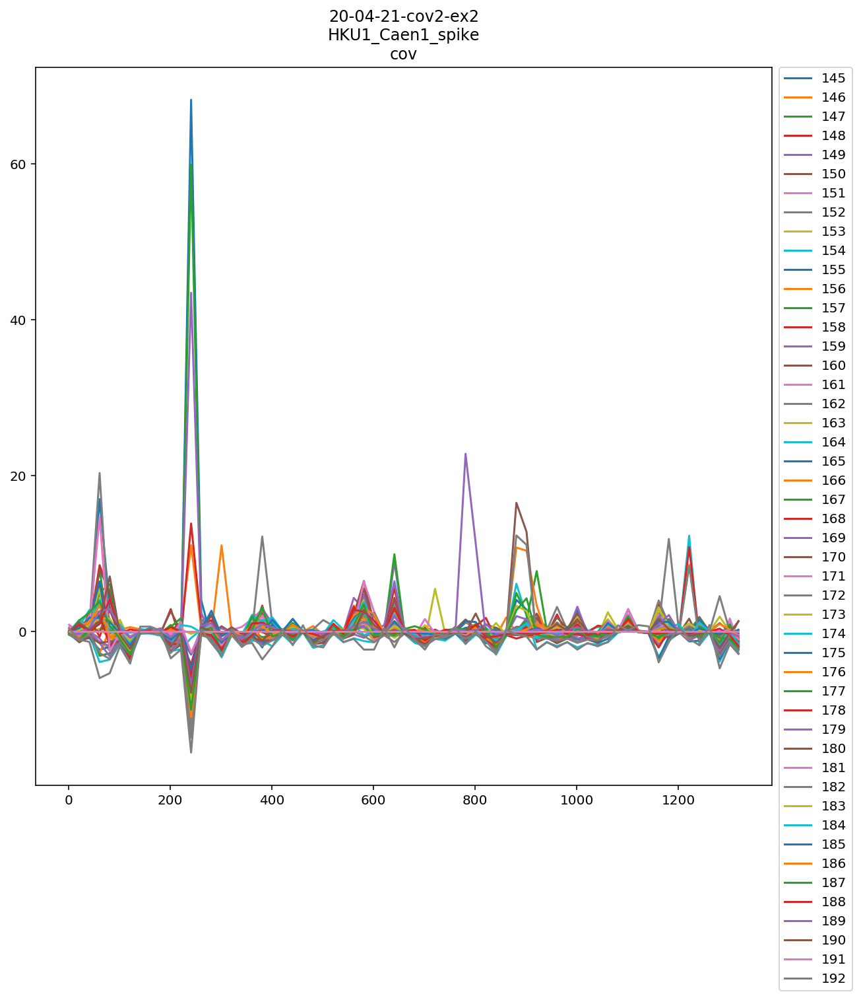

NL63_91156_spike


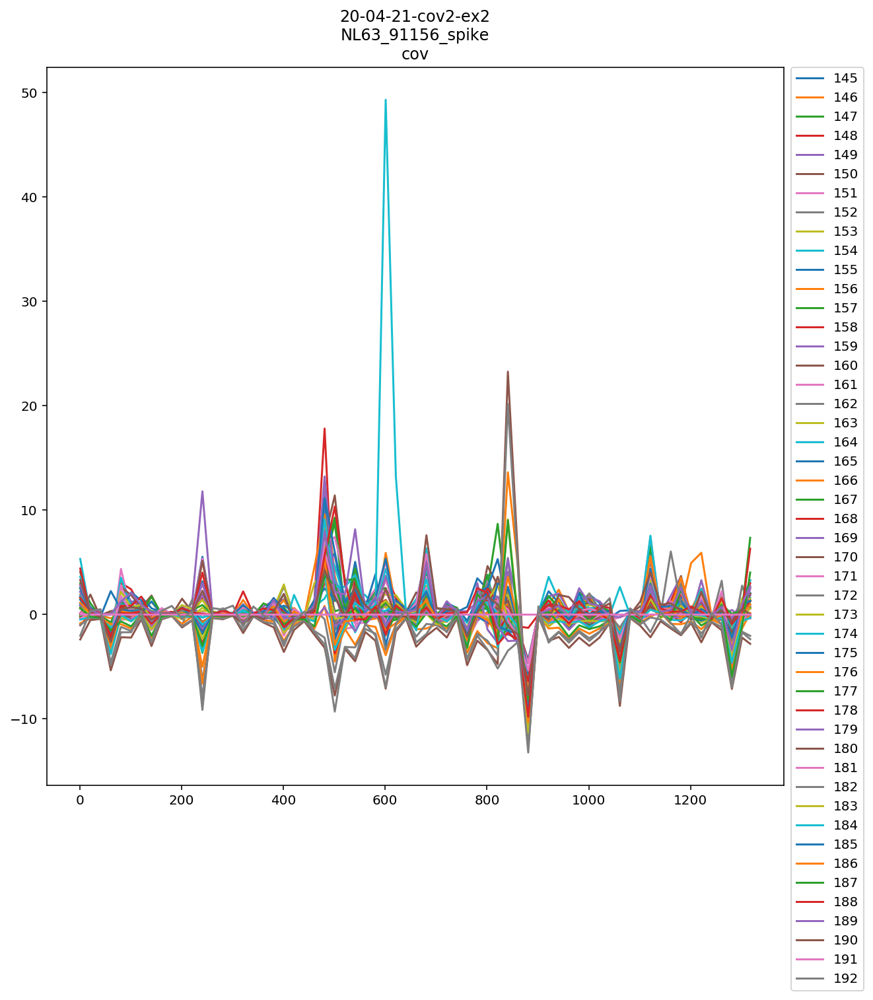

batSL_CoVZC45_nucleocapsid


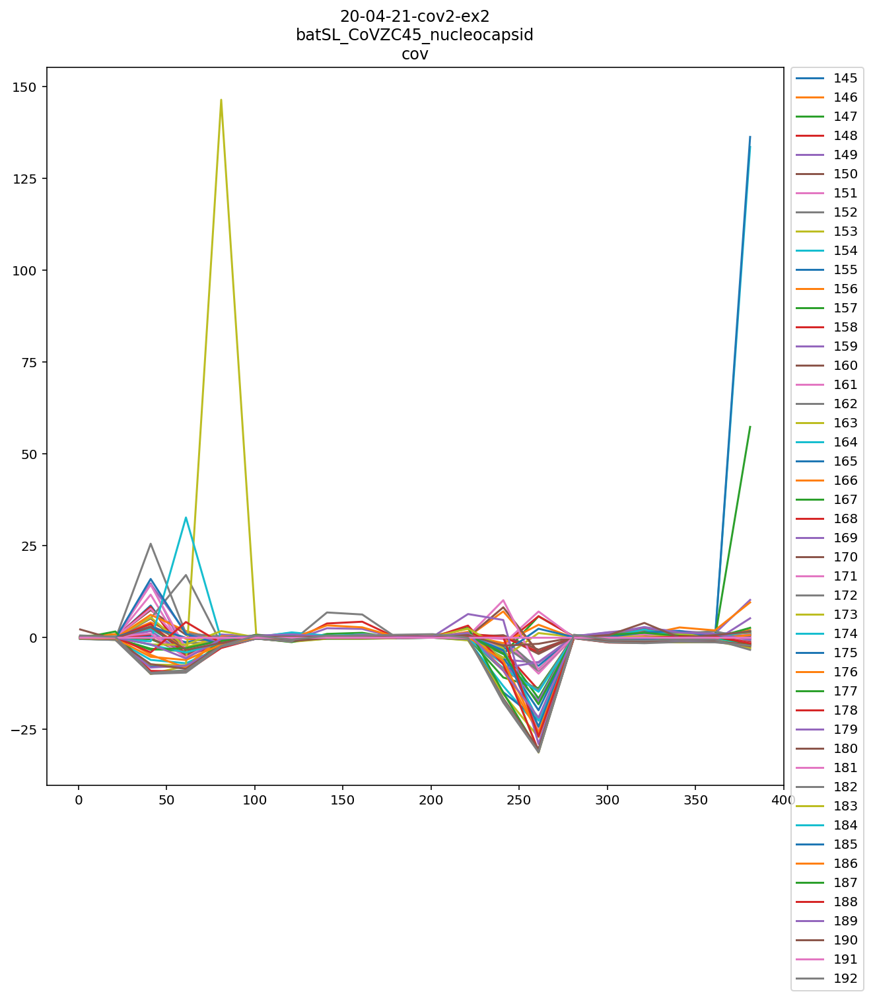

NL63_ChinaGD01_replicase_polyprotein_1ab


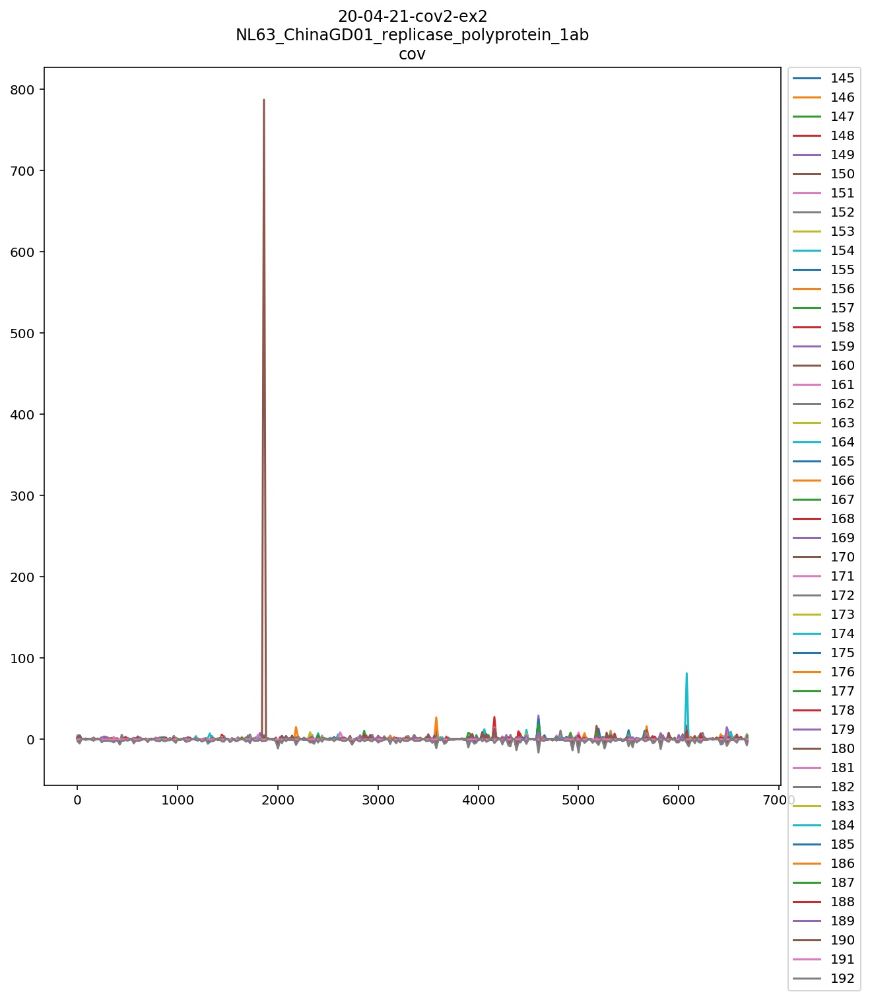

SARS_Urbani_spike


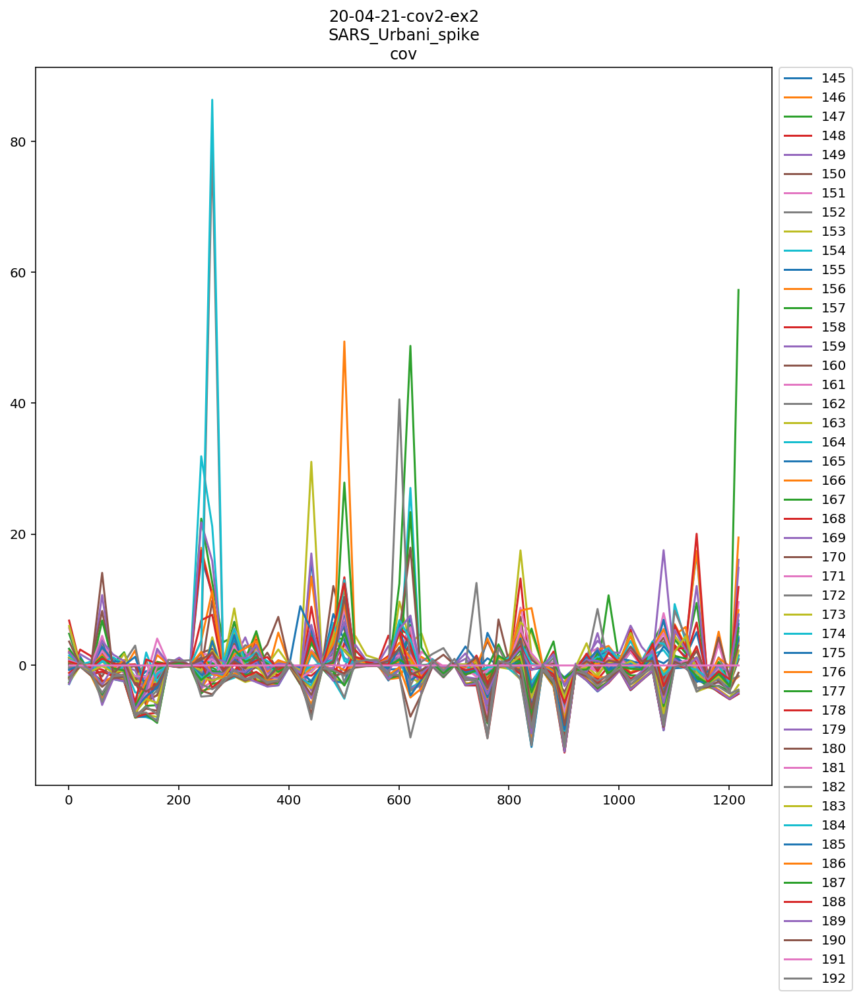

OC43_12689_spike


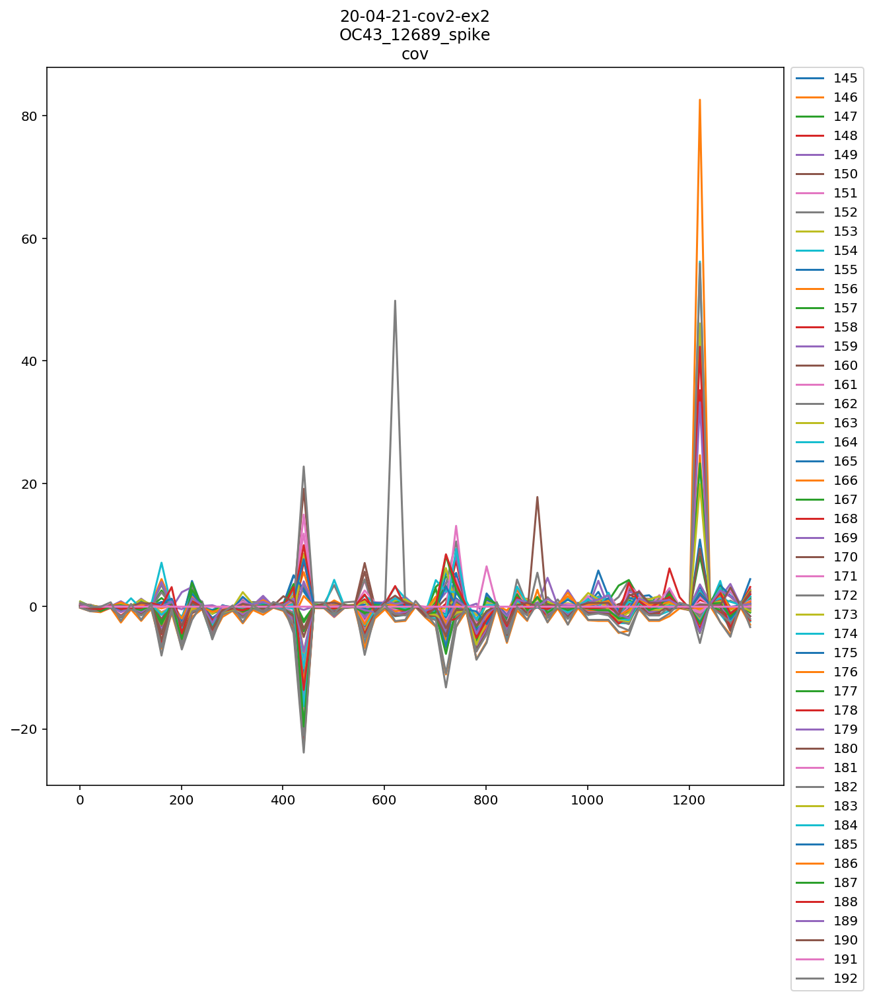

SARSCoV2_WuhanHu1_ORF3a_protein


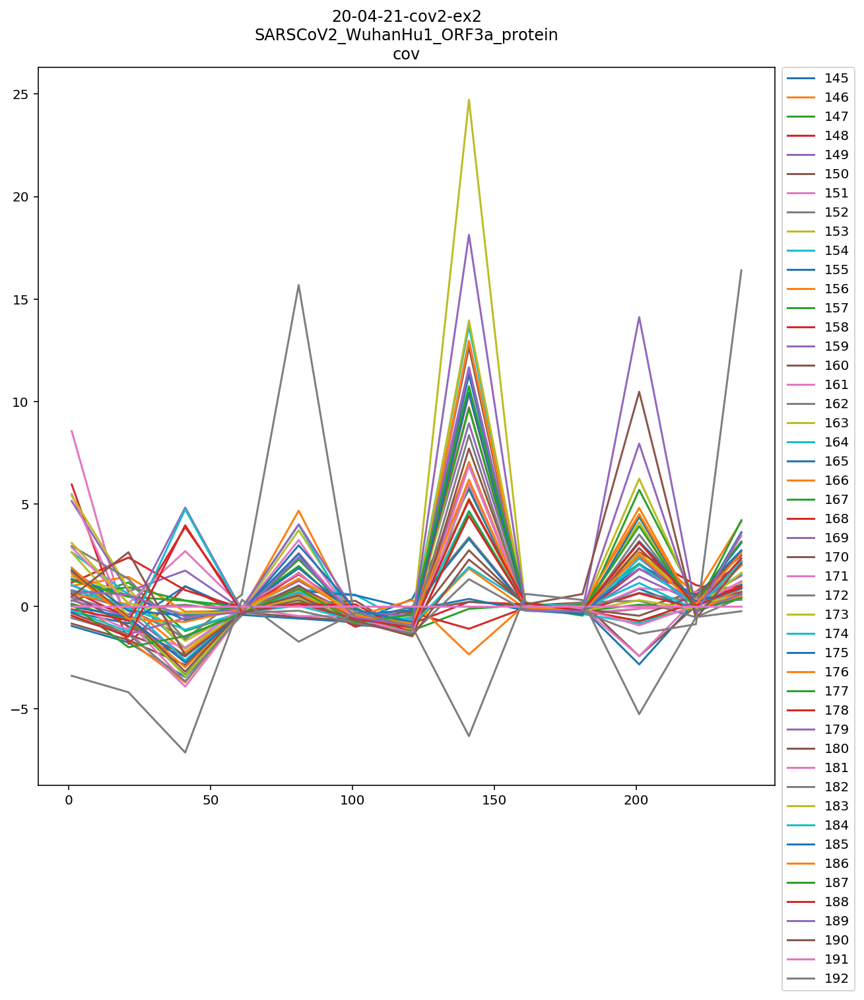

OC43_SC0776_spike


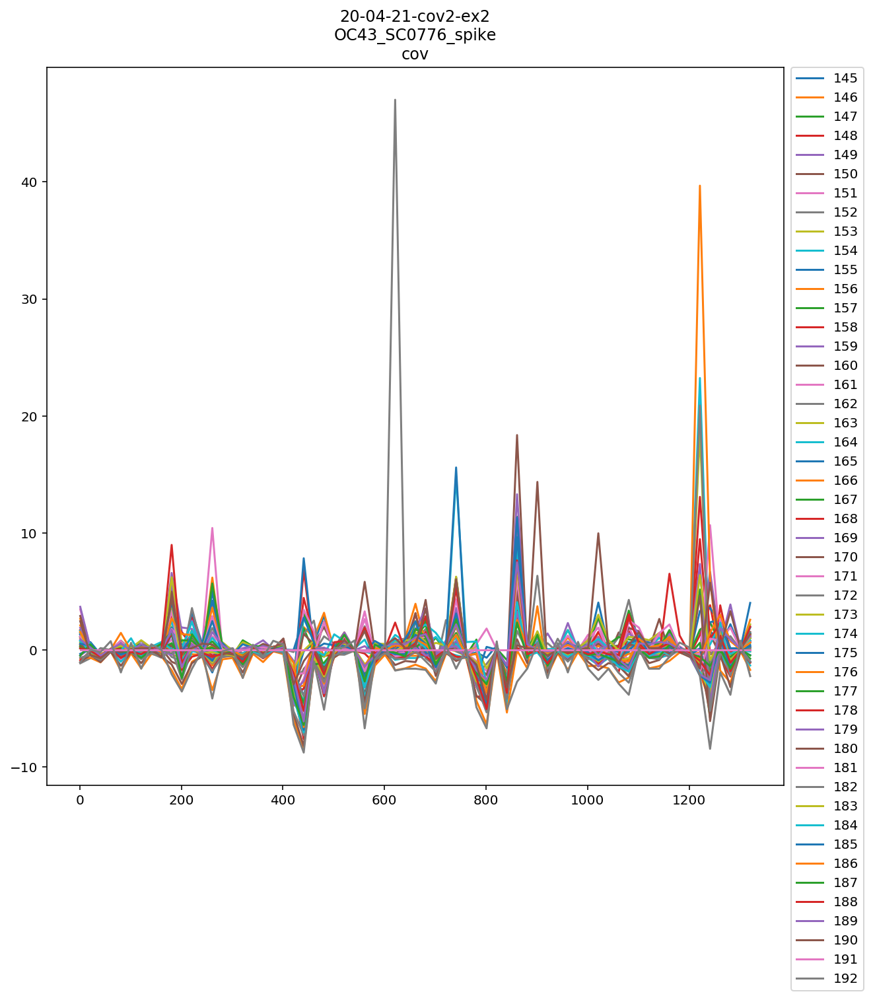

MERS_KFMC4_spike


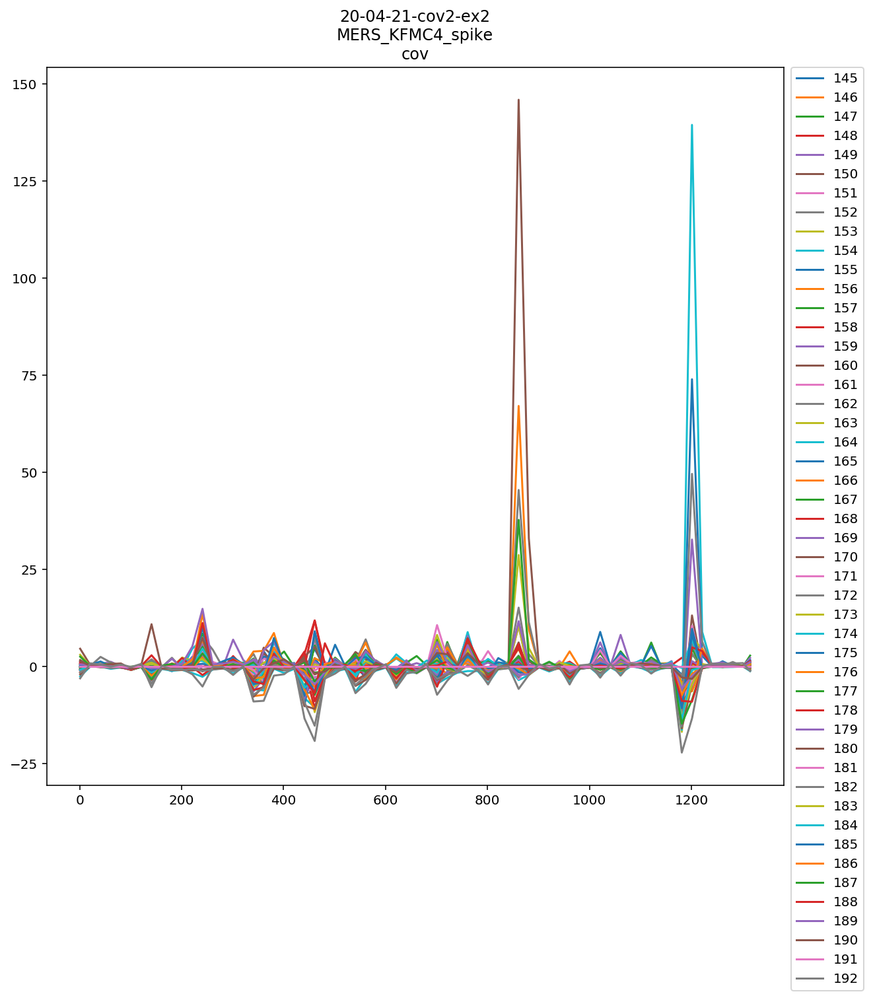

MERS_KFMC4_nucleocapsid


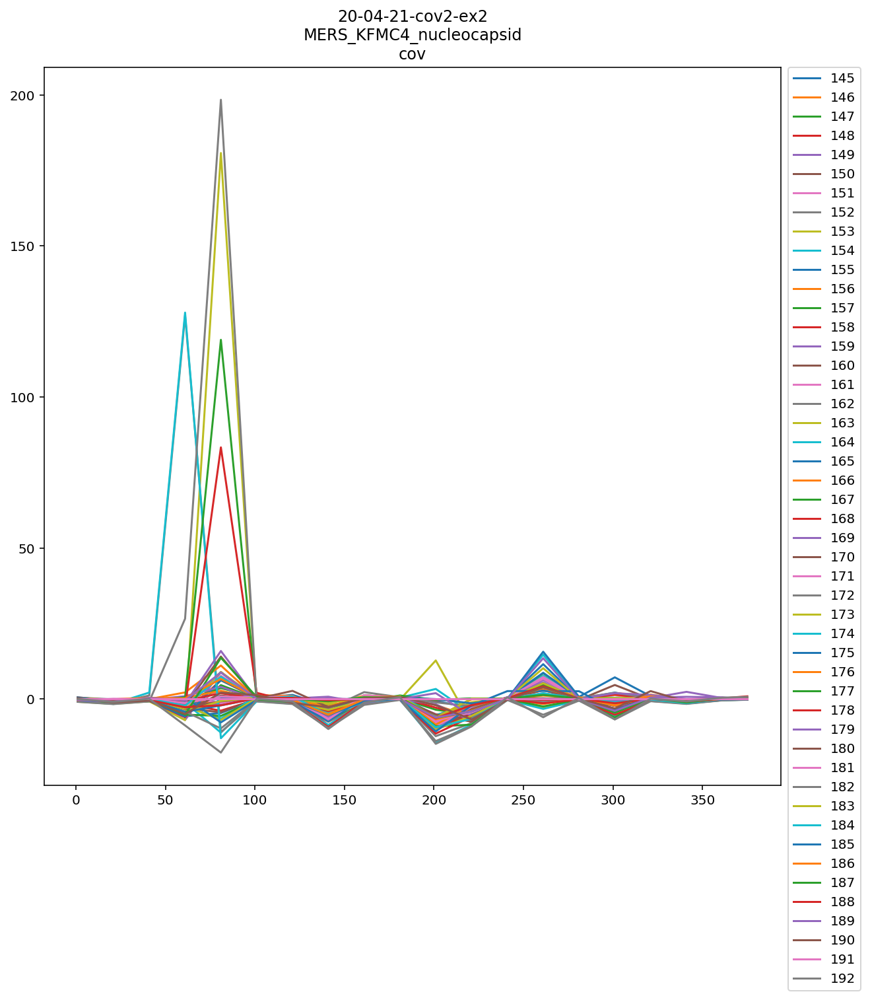

In [248]:
#OC43_98204_spike
interesting_strains_exp2 = [
    "OC43_98204_spike",
    "NL63_01231_spike",
    "NL63_01231_replicase_polyprotein_1ab",
    "SARS_Urbani_nucleocapsid",
    "SARSCoV2_WuhanHu1_spike",
    "HKU1_SI17244_spike",
    "HKU1_SI17244_nucleocapsid",
    "SARSCoV2_WuhanHu1_replicase_polyprotein_1ab",
    "229E_SC0865_replicase_polyprotein_1ab",
    "HKU1_Caen1_spike",
    "NL63_91156_spike",
    "batSL_CoVZC45_nucleocapsid",
    "NL63_ChinaGD01_replicase_polyprotein_1ab",
    "SARS_Urbani_spike",
    "OC43_12689_spike",
    "SARSCoV2_WuhanHu1_ORF3a_protein",
    "OC43_SC0776_spike",
    "MERS_KFMC4_spike",
    "MERS_KFMC4_nucleocapsid"
]
for strain in interesting_strains_exp2:
    print(strain)
    plot_virus_strain_standardized_enrichment(
        pds = experiment_dict["20-04-21-cov2-ex2"], 
        exp_name = "20-04-21-cov2-ex2", 
        virus = strain,
        sample_split_column = "reference" # all samples
    )

Next, we look a little closer at one of the strains, "HKU1_SI17244_spike", by grouping samples by different columns.

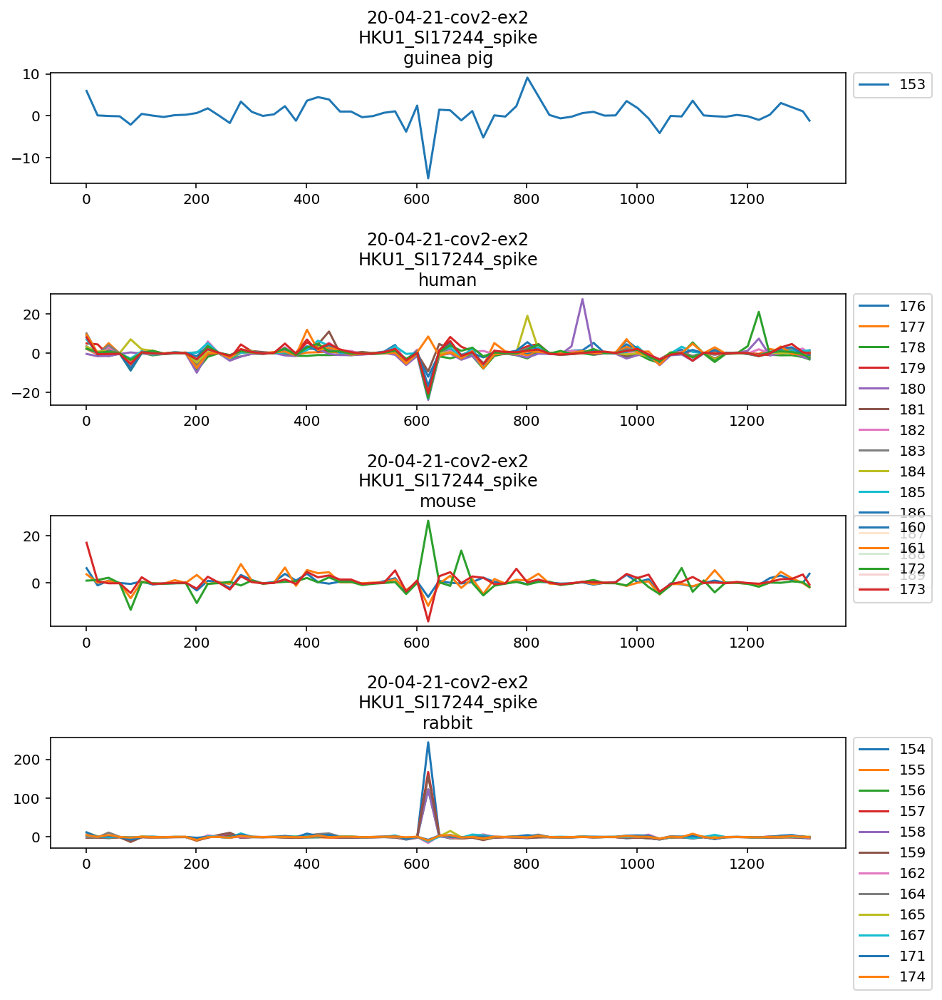

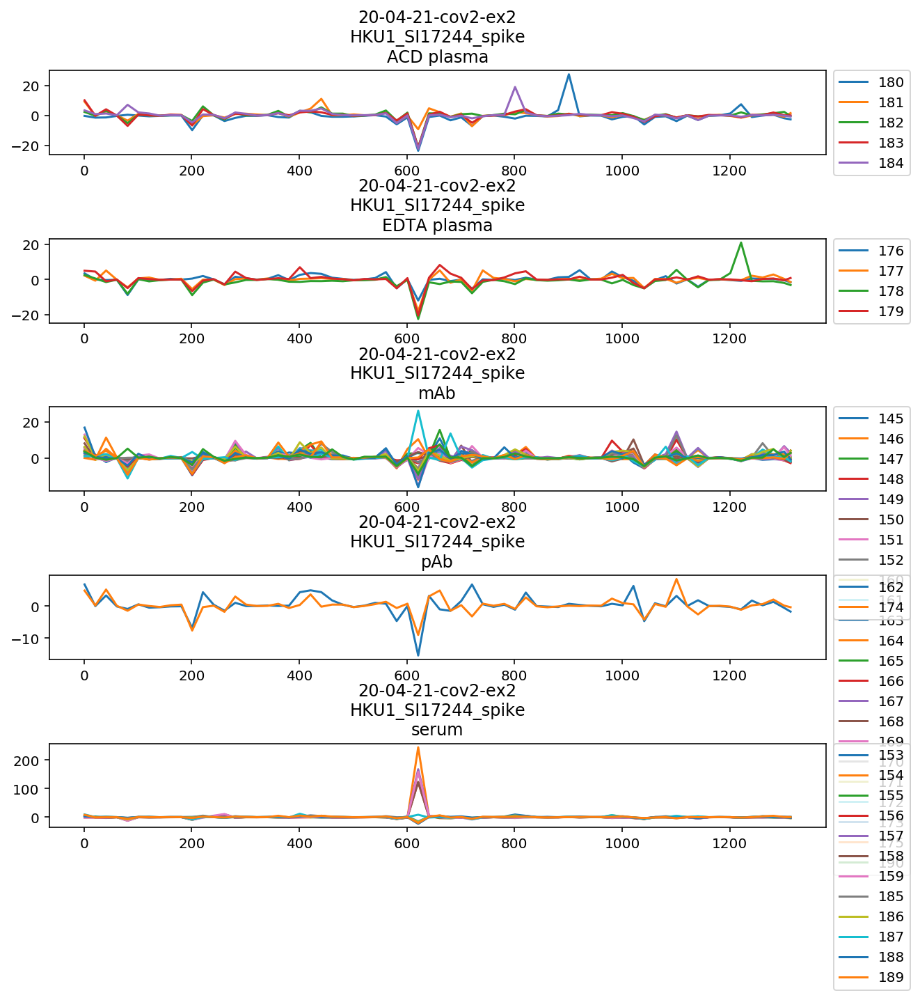

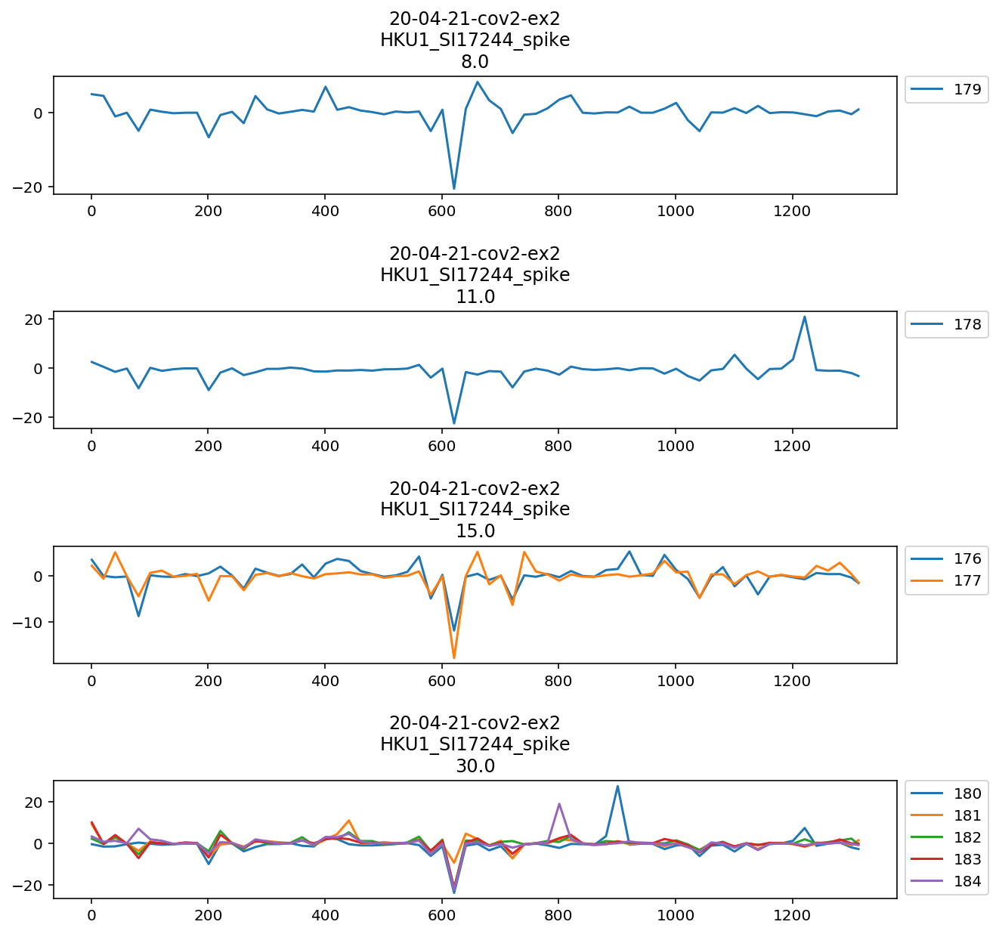

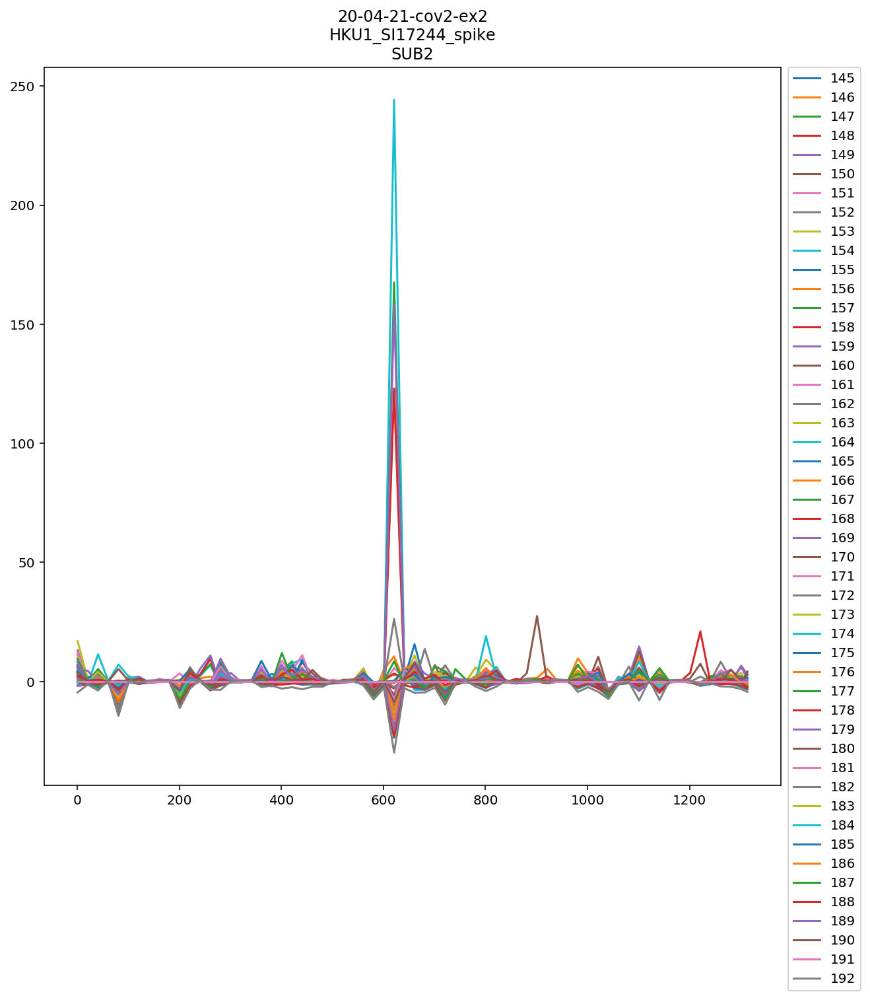

In [253]:
for col in ["species", "sample_type", "days_from_symptom_onset", "library_batch"]:
    plot_virus_strain_standardized_enrichment(
            pds = experiment_dict["20-04-21-cov2-ex2"], 
            exp_name = "20-04-21-cov2-ex2", 
            virus = "HKU1_SI17244_spike",
            sample_split_column = col
        )